## Packages

In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler

from IPython.core.display import display, HTML

## Import Dataset

In [68]:
absolute_part = 'C:\\Users\\usisavac\\Python\\Diplomski_Rad\\'

path_1 = absolute_part + 'data\\portal_articles_final_ml.csv'
path_2 = absolute_part + 'data\\portal_articles_covid_positivity_vader.csv'
path_3 = absolute_part + 'data\\portal_articles_covid.csv'

df_1 = pd.read_csv(path_1)
df_2 = pd.read_csv(path_2)

df_1.info()
df_2.info()

df = df_1

df.insert(23, 'Title_positivity_vader', df_2['Title_positivity_vader'].astype(float))
df.insert(24, 'Subtitle_positivity_vader', df_2['Subtitle_positivity_vader'].astype(float))
df.insert(25, 'Text_positivity_vader', df_2['Text_positivity_vader'].astype(float))

df_normal_names = pd.read_csv(path_3)

df['Title'] = df_normal_names['Title']
df['Subtitle'] = df_normal_names['Subtitle']
df['Article_text'] = df_normal_names['Article_text']

df.info()

df.to_csv(absolute_part + 'data\\portal_articles_final.csv', sep=',', index=False, header=True, encoding='utf-8')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3392 entries, 0 to 3391
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            3392 non-null   int64  
 1   Title                         3392 non-null   object 
 2   Subtitle                      3392 non-null   object 
 3   URL                           3392 non-null   object 
 4   Section                       3392 non-null   object 
 5   Article_text                  3392 non-null   object 
 6   Published_time                3392 non-null   object 
 7   Modified_time                 1115 non-null   object 
 8   Author                        3392 non-null   object 
 9   Comments                      3392 non-null   int64  
 10  Reaction_love                 3392 non-null   int64  
 11  Reaction_laugh                3392 non-null   int64  
 12  Reaction_hug                  3392 non-null   int64  
 13  Rea

## COVID-19 - Article Quantification

In [69]:

path_raw_binary = absolute_part + 'data\\portal_articles_covid_binary.csv'
path_raw_covid = absolute_part + 'data\\portal_articles_covid.csv'

df_raw_binary = pd.read_csv(path_raw_binary)
df_raw = pd.read_csv(path_raw_covid)


# Total article count
article_count = df_raw_binary.shape[0]

# Covid article count
article_covid_count = df_raw_binary[(df_raw_binary.COVID == 1)].shape[0]

# Articles which satisfy our conditions
articles_considered = df_raw.shape[0]

data = {'Kolicina': [article_count, article_covid_count, articles_considered]}

df_article_quantification = pd.DataFrame(data, index=[
    'Ukupan broj clanaka:',
    'Ukupan broj COVID clanaka:',
    'Ukupan broj iskoristivih clanaka:'])

df_article_quantification

,Kolicina
Ukupan broj clanaka:,34332
Ukupan broj COVID clanaka:,12717
Ukupan broj iskoristivih clanaka:,3392


## Article Count by Positivity

In [70]:

print('COVID articles count:')
df.Positivity.value_counts(ascending=True)
print('Selected articles count:')
df.Positivity.value_counts(ascending=True)

NONNEGATIVE    1121
NEGATIVE       2271
Name: Positivity, dtype: int64

## Emoji Total Count

Reaction_sad       24346
Reaction_love      22205
Reaction_mad       18868
Reaction_laugh     12434
Reaction_hug        6023
Reaction_ponder     5581
dtype: int64


Text(0, 0.5, 'Total Emoji Count')

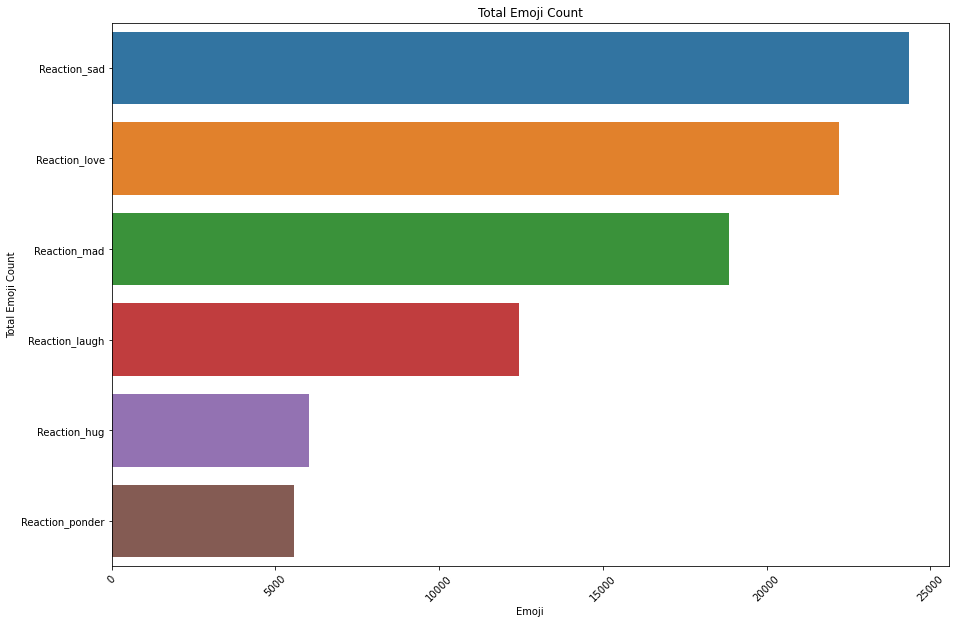

In [71]:
series_emojis = df.iloc[:,10:16].sum().sort_values(ascending=False)

print(series_emojis)

sns.barplot(y = series_emojis.index, x = series_emojis.values)

fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.xticks(rotation=45, fontsize = 10)
plt.title('Total Emoji Count')
plt.xlabel('Emoji')
plt.ylabel('Total Emoji Count')

## Total Emoji Count

In [122]:
df_total_non_neg = df.copy()
df_total_neg = df.copy()

emoji_list = ['Reaction_sad', 'Reaction_mad', 'Reaction_love', 'Reaction_laugh', 'Reaction_hug', 'Reaction_ponder']

df_total_non_neg['Total_nonneg'] = df.loc[df_total_non_neg.Positivity == 'NONNEGATIVE', emoji_list].sum(axis=1)
print('Total number of reactions on non-negative articles:', df_total_non_neg['Total_nonneg'].sum().astype(int))

df_total_neg['Total_neg'] = df.loc[df_total_non_neg.Positivity == 'NEGATIVE', emoji_list].sum(axis=1)
print('Total number of reactions on negative articles:', df_total_neg['Total_neg'].sum().astype(int))

df_total_emoji_sum_by_class= df.groupby('Positivity').agg({
    'Reaction_love' : ['sum'], 
    'Reaction_laugh' : ['sum'],
    'Reaction_hug' : ['sum'],
    'Reaction_ponder' : ['sum'],
    'Reaction_sad' : ['sum'],
    'Reaction_mad' : ['sum']
    })

df_total_emoji_sum_by_class


Total number of reactions on non-negative articles: 20623
Total number of reactions on negative articles: 41204


,Reaction_love,Reaction_laugh,Reaction_hug,Reaction_ponder,Reaction_sad,Reaction_mad
,sum,sum,sum,sum,sum,sum
Positivity,,,,,,
NEGATIVE,2844,6772,1388,2471,16457,11272
NONNEGATIVE,13295,1569,2645,1001,812,1301


## Article Quantification by Category

In [73]:
pd.crosstab(df.Section, df.Positivity.count()).sort_values(df.Positivity.count(), ascending=False)

col_0,3392
Section,
Vijesti,1564
Dalmacija,1286
Relax,288
Sport,189
Hrvatska,19
Kolumne,19
Izbori-2021,9
Specijali,8
Split,4


## Positivity by Category

Text(0, 0.5, 'Number of Articles')

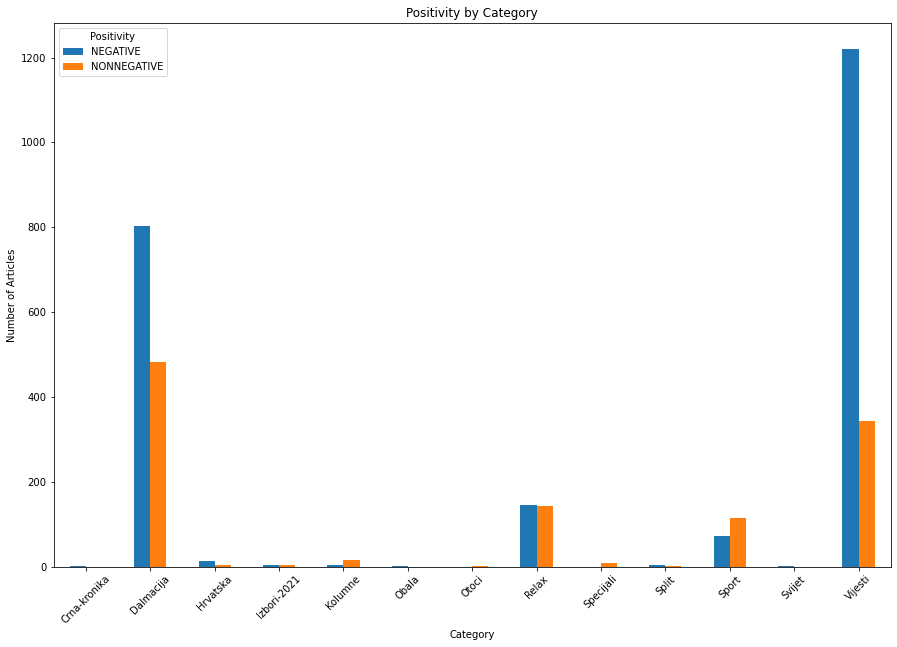

In [74]:
pd.crosstab(df.Section, df.Positivity).plot.bar()

fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.xticks(rotation=45, fontsize = 10)
plt.title('Positivity by Category')
plt.xlabel('Category')
plt.ylabel('Number of Articles')


In [75]:
df_total_emoji_sum_by_category = df.groupby('Section').agg({
    'Reaction_love' : ['sum'], 
    'Reaction_laugh' : ['sum'],
    'Reaction_hug' : ['sum'],
    'Reaction_ponder' : ['sum'],
    'Reaction_sad' : ['sum'],
    'Reaction_mad' : ['sum']
    })

df_total_emoji_sum_by_category.to_html(absolute_part+'\\tables\\total_emoji_sum_by_category.html')
df_total_emoji_sum_by_category


,Reaction_love,Reaction_laugh,Reaction_hug,Reaction_ponder,Reaction_sad,Reaction_mad
,sum,sum,sum,sum,sum,sum
Section,,,,,,
Crna-kronika,2,5,2,4,192,15
Dalmacija,14280,5158,3330,2803,14343,10652
Hrvatska,117,50,38,39,128,295
Izbori-2021,91,74,10,37,11,21
Kolumne,243,35,59,17,35,15
Obala,4,35,2,43,48,138
Otoci,4,3,1,2,1,2
Relax,2358,2634,701,445,960,811


## Total Emoji Sum by Category

## Mean Emoji Value by Category

In [76]:
mean_emoji_value_by_category = df.groupby('Section').agg({
    'Reaction_love' : ['mean'], 
    'Reaction_laugh' : ['mean'],
    'Reaction_hug' : ['mean'],
    'Reaction_ponder' : ['mean'],
    'Reaction_sad' : ['mean'],
    'Reaction_mad' : ['mean']
    })

mean_emoji_value_by_category.to_html(absolute_part+'\\tables\\mean_emoji_value_by_category.html')
display(HTML(mean_emoji_value_by_category.to_html()))

,Reaction_love,Reaction_laugh,Reaction_hug,Reaction_ponder,Reaction_sad,Reaction_mad
,mean,mean,mean,mean,mean,mean
Section,,,,,,
Crna-kronika,1.000000,2.500000,1.000000,2.000000,96.000000,7.500000
Dalmacija,11.104199,4.010886,2.589425,2.179627,11.153188,8.283048
Hrvatska,6.157895,2.631579,2.000000,2.052632,6.736842,15.526316
Izbori-2021,10.111111,8.222222,1.111111,4.111111,1.222222,2.333333
Kolumne,12.789474,1.842105,3.105263,0.894737,1.842105,0.789474
Obala,4.000000,35.000000,2.000000,43.000000,48.000000,138.000000
Otoci,4.000000,3.000000,1.000000,2.000000,1.000000,2.000000
Relax,8.187500,9.145833,2.434028,1.545139,3.333333,2.815972


## Outlier Cleaning

In [77]:
def clean_outliers(df, column, min_quan, max_quan):
    df[column] = np.where(df[column] < df[column].quantile(min_quan), df[column].quantile(min_quan),df[column])
    df[column] = np.where(df[column] > df[column].quantile(max_quan), df[column].quantile(max_quan),df[column])

    print('\n',df[column].describe())

min_quan = 0.10
max_quan = 0.90

clean_outliers(df, 'Text_positivity', min_quan, max_quan)
clean_outliers(df, 'Text_positivity_sentence', min_quan, max_quan)

clean_outliers(df, 'Title_positivity', min_quan, max_quan)
clean_outliers(df, 'Title_positivity_sentence', min_quan, max_quan)

clean_outliers(df, 'Subtitle_positivity', min_quan, max_quan)
clean_outliers(df, 'Subtitle_positivity_sentence', min_quan, max_quan)


 count    3392.000000
mean        0.002022
std         0.004960
min        -0.004952
25%        -0.001925
50%         0.001366
75%         0.005545
max         0.010896
Name: Text_positivity, dtype: float64

 count    3392.000000
mean       -0.006240
std         0.007901
min        -0.021112
25%        -0.011960
50%        -0.003529
75%         0.000543
max         0.002159
Name: Text_positivity_sentence, dtype: float64

 count    3392.000000
mean        0.007348
std         0.018367
min        -0.018759
25%        -0.005761
50%         0.004412
75%         0.017831
max         0.042300
Name: Title_positivity, dtype: float64

 count    3392.000000
mean        0.000559
std         0.003844
min        -0.006469
25%        -0.001571
50%         0.000530
75%         0.002903
max         0.007025
Name: Title_positivity_sentence, dtype: float64

 count    3392.000000
mean        0.003245
std         0.015121
min        -0.020166
25%        -0.007282
50%         0.001915
75%         0.012257

## Tablica - Mjesečna kvota negativnih, pozitivnih i neutralnih i prosječna pozitivnost

In [78]:
# Define a new dataframe using initial dataframe
df_month = df

df_month['Month'] = pd.DatetimeIndex(df_month['Published_time']).month
df_month['Year'] = pd.DatetimeIndex(df_month['Published_time']).year

df_month['Month/Year'] = (df_month.Year.astype(str) + '/' + df_month.Month.astype(str))
df_month['Month/Year'].unique()

df_month['Positivity_nonneg'] = df_month['Positivity']
df_month['Positivity_neg'] = df_month['Positivity']

article_month = df_month.pivot_table(index = ['Month/Year'], 
                                            aggfunc = {
                                            'Positivity_neg':lambda x: (x  ==  'NEGATIVE').sum(),
                                            'Positivity_nonneg':lambda x: (x  ==  'NONNEGATIVE').sum()}) 

article_month.index.name = 'Month/Year'

article_month.index = pd.Categorical(article_month.index,['2020/3','2020/4','2020/5','2020/6','2020/9','2020/10','2020/11',
'2020/12','2021/1','2021/2','2021/3','2021/4'], ordered=True) 

article_month.sort_index(inplace=True)
article_month




,Positivity_neg,Positivity_nonneg
2020/3,0,1
2020/4,3,0
2020/5,0,2
2020/6,0,1
2020/9,1,3
2020/10,291,104
2020/11,487,222
2020/12,427,229
2021/1,300,156
2021/2,252,171


Text(0, 0.5, 'Positivity Count')

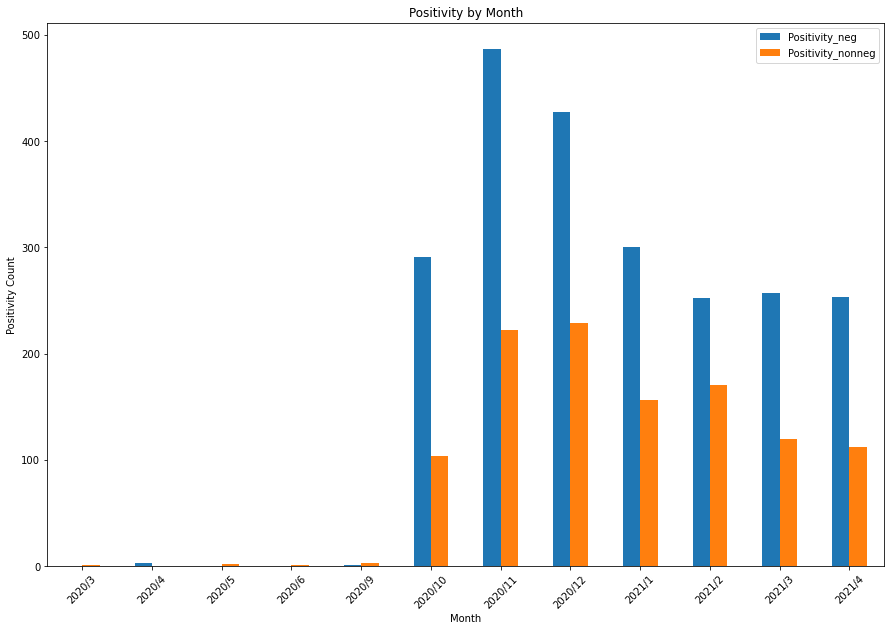

In [123]:
article_month.plot.bar()

fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.xticks(rotation=45, fontsize = 10)
plt.title('Positivity by Month')
plt.xlabel('Month')
plt.ylabel('Positivity Count')

## Data Normalization

* Data is normalized in range (-1,1) for sentiment positivity columns
* NaN values are dropped separately


In [80]:

df_text = df

df_text.dropna(subset = ['Text_positivity','Text_positivity_sentence', 'Text_positivity_vader'], inplace=True)

df_text[['Text_positivity', 'Text_positivity_sentence', 'Text_positivity_vader']] = MinMaxScaler(feature_range=(-1,1)).fit_transform(df_text[['Text_positivity', 'Text_positivity_sentence', 'Text_positivity_vader']])

df_text[['Text_positivity', 'Text_positivity_sentence', 'Text_positivity_vader']].describe()


,Text_positivity,Text_positivity_sentence,Text_positivity_vader
count,3364.000000,3364.000000,3364.000000
mean,-0.122606,0.275696,0.128616
std,0.625773,0.679300,0.312755
min,-1.000000,-1.000000,-1.000000
25%,-0.620294,-0.219768,-0.076874
50%,-0.203288,0.506360,0.134301
75%,0.320483,0.860686,0.336364
max,1.000000,1.000000,1.000000


In [81]:

df_title = df
df_title.dropna(subset = ['Title_positivity','Title_positivity_sentence', 'Title_positivity_vader'], inplace=True)

df_title[['Title_positivity', 'Title_positivity_sentence','Title_positivity_vader']] = MinMaxScaler(feature_range=(-1,1)).fit_transform(df_title[['Title_positivity', 'Title_positivity_sentence','Title_positivity_vader']])

df_title[['Title_positivity', 'Title_positivity_sentence','Title_positivity_vader']].describe()



,Title_positivity,Title_positivity_sentence,Title_positivity_vader
count,2225.000000,2225.000000,2225.000000
mean,-0.175162,0.002733,-0.031867
std,0.613729,0.587846,0.528577
min,-1.000000,-1.000000,-1.000000
25%,-0.634136,-0.350629,-0.522148
50%,-0.274310,0.005646,-0.058548
75%,0.183986,0.360175,0.442170
max,1.000000,1.000000,1.000000


## Total Positivity Day-By-Day (Normalized)

### Day-By-Day - Article Text

Text(0, 0.5, 'Positivity Score')

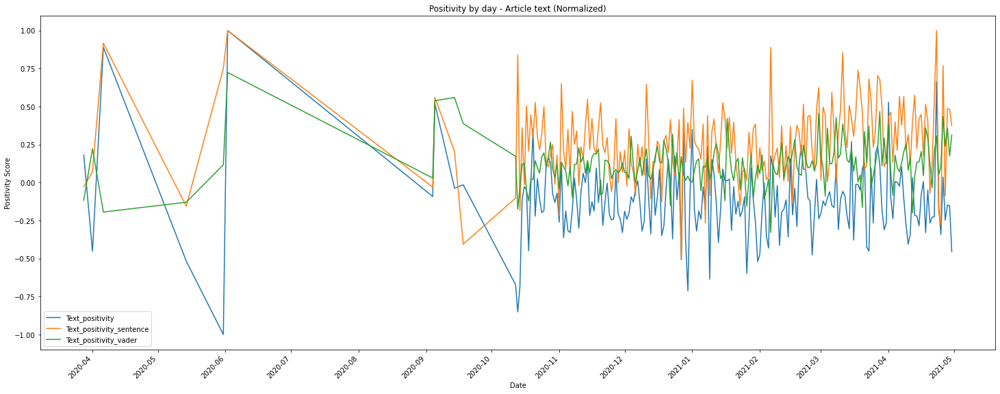

In [82]:
import matplotlib.dates as mdates

df_text['Published_time'] = pd.to_datetime(df_text['Published_time'])

df_day = df_text.pivot_table(index = ['Published_time'], 
                                            aggfunc = {'Text_positivity':lambda x: x.mean(),
                                                'Text_positivity_sentence':lambda x: x.mean(), 
                                                'Text_positivity_vader':lambda x: x.mean()})

ax_day_text = df_day.plot(x_compat=True)
ax_day_text.xaxis.set_major_locator(mdates.MonthLocator())

fig = plt.gcf()
fig.set_size_inches(25, 10)

plt.xticks(rotation=45, fontsize = 10)

plt.title('Positivity by day - Article text (Normalized)')
plt.xlabel('Date')
plt.ylabel('Positivity Score')

### Day-By-Day - Title

Text(0, 0.5, 'Positivity Score')

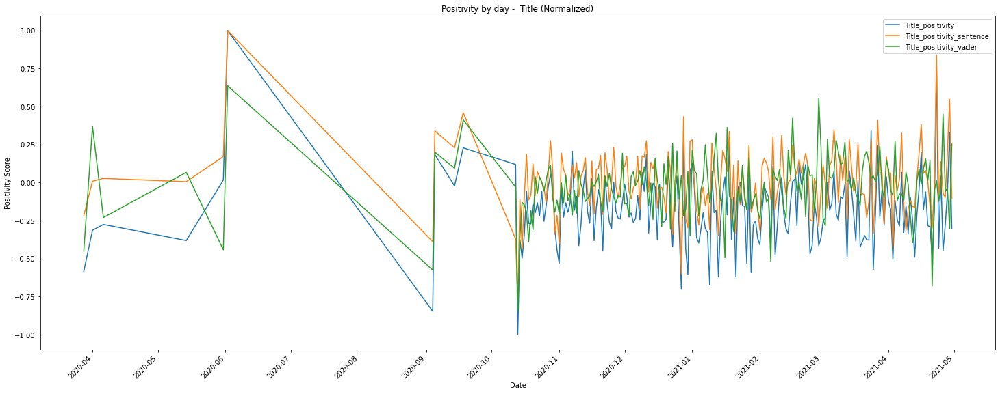

In [83]:
import matplotlib.dates as mdates

df_day_title = df_title.pivot_table(index = ['Published_time'], 
                                            aggfunc = {'Title_positivity':lambda x: x.mean(),
                                                'Title_positivity_sentence':lambda x: x.mean(), 
                                                'Title_positivity_vader':lambda x: x.mean()})

ax_day_title = df_day_title.plot(x_compat=True)
ax_day_title.xaxis.set_major_locator(mdates.MonthLocator())


fig = plt.gcf()
fig.set_size_inches(25, 10)
plt.xticks(rotation=45, fontsize = 10)
plt.title('Positivity by day -  Title (Normalized)')
plt.xlabel('Date')
plt.ylabel('Positivity Score')

## Model evaulation function

In [84]:
from sklearn import metrics
import numpy as np
from collections import Counter

def model_metrics(df, positivity_algorithm):
    """
    Calculate precision, recall, f1 value and accuracy
    """

    # Create a df copy to avoid accidental modification
    df = df.copy()

    # Positivity class limits
    df.loc[df[positivity_algorithm] >= 0., 'Positivity_algorithm_result'] = 'NONNEGATIVE'
    df.loc[df[positivity_algorithm] < 0, 'Positivity_algorithm_result'] = 'NEGATIVE'

    y_true = df['Positivity'].to_list()
    y_pred = df['Positivity_algorithm_result'].to_list()

    print('===================================\n')
    print("True value count: ", Counter(y_true))
    print("Prediction value count: ", Counter(y_pred))
    print('\n', metrics.classification_report(y_true, y_pred))
    print("Accuracy Score: ",metrics.accuracy_score(y_true, y_pred)*100)


## Vader - Title


In [85]:


df_vader_positivity_title = df_title[['Title', 'URL', 'Title_positivity_vader','Positivity']]
model_metrics(df_vader_positivity_title, 'Title_positivity_vader')

df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=True).head(100).to_html(absolute_part+'\\tables\\df_vader_positivity_title_positive.html', justify='left', render_links = True)
display(HTML(df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=True).head(10).to_html(justify='left', render_links = True)))


True value count:  Counter({'NEGATIVE': 1453, 'NONNEGATIVE': 772})
Prediction value count:  Counter({'NEGATIVE': 1138, 'NONNEGATIVE': 1087})

               precision    recall  f1-score   support

    NEGATIVE       0.77      0.60      0.68      1453
 NONNEGATIVE       0.47      0.66      0.55       772

    accuracy                           0.62      2225
   macro avg       0.62      0.63      0.61      2225
weighted avg       0.67      0.62      0.63      2225

Accuracy Score:  62.29213483146068


,Title,URL,Title_positivity_vader,Positivity
3069,Pijetao ubio policajca koji je pokušao zaustaviti ilegalnu borbu pijetlova,https://www.dalmacijadanas.hr/pijetao-ubio-policajca-koji-je-pokusao-zaustaviti-ilegalnu-borbu-pijetlova/,-1.000000,NEGATIVE
1736,"SERIJSKI UBOJICA UMRO OD KORONE Ubio je čak 17 ljudi, zvali su ga ‘monstrum vlakova’",https://www.dalmacijadanas.hr/serijski-ubojica-umro-od-korone-ubio-je-cak-17-ljudi-zvali-su-ga-monstrum-vlakova/,-0.998511,NEGATIVE
3050,"Uhićen muškarac koji je Berošu prijetio putem interneta, evo kolika je kazna za širenje govora mržnje",https://www.dalmacijadanas.hr/uhicen-muskarac-koji-je-berosu-prijetio-putem-interneta-evo-kolika-je-kazna-za-sirenje-govora-mrznje/,-0.992130,NEGATIVE
1459,UGOSTITELJIMA PREKIPJELO Medak i Jakominić odstupili: “Ljudi su bijesni jer ih se dugo zavaravalo”,https://www.dalmacijadanas.hr/ugostiteljima-prekipjelo-medak-i-jakominic-odstupili-ljudi-su-bijesni-jer-ih-se-dugo-zavaravalo/,-0.982983,NEGATIVE
1364,"PROPUST LIJEČNIKA IZ DALMACIJE “Moj djed je umirao u mukama, a liječnik iz Hitne mi je prijetio policijom”",https://www.dalmacijadanas.hr/propust-lijecnika-iz-dalmacije-moj-djed-je-umirao-u-mukama-a-lijecnik-iz-hitne-mi-je-prijetio-policijom/,-0.980963,NEGATIVE
2341,"Upozorenje Vladi: “Ograničenog rada poslodavci trpe goleme gubitke, a potpunim zatvaranjem poslovno stanje postat će financijski neizdrživo”",https://www.dalmacijadanas.hr/upozorenje-vladi-ogranicenog-rada-poslodavci-trpe-goleme-gubitke-a-potpunim-zatvaranjem-poslovno-stanje-postat-ce-financijski-neizdrzivo/,-0.979474,NONNEGATIVE
1212,Horvatinčić traži novu odgodu zatvora: “Trpi velike bolove”,https://www.dalmacijadanas.hr/horvatincic-trazi-novu-odgodu-zatvora-trpi-velike-bolove/,-0.972454,NEGATIVE
2591,Dr. Ivić o smrti maturantice: “Ovo je upozorenje nama svima da smo možda mogli napraviti nešto što je možda moglo spriječiti ovu smrt”,https://www.dalmacijadanas.hr/dr-ivic-o-smrti-maturantice-ovo-je-upozorenje-nama-svima-da-smo-mozda-mogli-napraviti-nesto-sto-je-mozda-moglo-sprijeciti-ovu-smrt/,-0.968306,NEGATIVE
1439,DETALJI STRAŠNE PROMETNE NESREĆE Blagajnik HAC-a poginuo pola sata prije kraja smjene,https://www.dalmacijadanas.hr/detalji-strasne-prometne-nesrece-blagajnik-hac-a-poginuo-pola-sata-prije-kraja-smjene/,-0.965328,NEGATIVE
984,NAPETO U MOSTARU Noćna prosvjedna šetnja protiv brutalnog premlaćivanja mladića,https://www.dalmacijadanas.hr/napeto-u-mostaru-nocna-prosvjedna-setnja-protiv-brutalnog-premlacivanja-mladica/,-0.960117,NEGATIVE


In [86]:
df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=False).head(100).to_html(absolute_part+'\\tables\\df_vader_positivity_title_negative.html', justify='left', render_links = True)
display(HTML(df_vader_positivity_title.sort_values(by='Title_positivity_vader', ascending=False).head(10).to_html(justify='left', render_links = True)))

,Title,URL,Title_positivity_vader,Positivity
45,"SPLIĆANI IMAJU VELIKO SRCE Još jedna akcija darivanja krvi bila je uspješna: “Hvala vam svima, nekome ste spasili život”",https://www.dalmacijadanas.hr/splicani-imaju-veliko-srce-jos-jedna-akcija-darivanja-krvi-bila-je-uspjesna-hvala-vam-svima-nekome-ste-spasili-zivot/,1.000000,NONNEGATIVE
75,Milanović uputio čestitku za Međunarodni praznik rada: “Pozivam odgovorne da prihvate savjete onih koji znaju i mogu stvoriti nove vrijednosti i zaposliti ljude”,https://www.dalmacijadanas.hr/milanovic-uputio-cestitku-za-medunarodni-praznik-rada-pozivam-odgovorne-da-prihvate-savjete-onih-koji-znaju-i-mogu-stvoriti-nove-vrijednosti-i-zaposliti-ljude/,0.987025,NONNEGATIVE
700,Splitski HDZ slavi 31. godišnjicu: “Povjerenje koje imamo kako bi predvodili naš narod kroz sve nedaće je posebna čast i najveća odgovornost”,https://www.dalmacijadanas.hr/splitski-hdz-slavi-31-godisnjicu-povjerenje-koje-imamo-kako-bi-predvodili-nas-narod-kroz-sve-nedace-je-posebna-cast-i-najveca-odgovornost/,0.981494,NEGATIVE
375,ROMANSA S MOSORA Prije četrdeset godina uspon ”Sto žena na vrh Mosora” stvorio je predivnu ljubavnu priču,https://www.dalmacijadanas.hr/romansa-s-mosora-prije-cetrdeset-godina-uspon-sto-zena-na-vrh-mosora-stvorio-je-predivnu-ljubavnu-pricu/,0.980324,NONNEGATIVE
2142,"SPLITSKI GLAZBENICI POKRENULI LAVINU DOBROTE: “Ako ova pjesma pobudi barem jednu žaruljicu nade, mi smo beskrajno sretni i ponosni”",https://www.dalmacijadanas.hr/splitski-glazbenici-pokrenuli-lavinu-dobrote-ako-ova-pjesma-pobudi-barem-jednu-zaruljicu-nade-mi-sam-beskrajno-sretni-i-ponosni/,0.965116,NONNEGATIVE
927,"ULJEPŠAVANJE ZIDOVA SPLITSKOG UČENIČKOG DOMA: “Učenički dom Split bogatiji je za još jedan mural, posvećen najlipšoj rivi na svitu”",https://www.dalmacijadanas.hr/uljepsavalje-zidova-splitskog-ucenickog-doma-ucenicki-dom-split-bogatiji-je-za-jos-jedan-mural-posvecen-najlipsoj-rivi-na-svitu/,0.965009,NONNEGATIVE
876,"VELIKO SRCE MLADOG HVARANINA Umjesto na faks, otišao volontirati u Tanzaniju: “Ljudi žive normalno, a mrtvih po cestama nema”",https://www.dalmacijadanas.hr/veliko-srce-mladog-hvaranina-umjesto-na-faks-otisao-volontirati-u-tanzaniju-ljudi-zive-normalno-a-mrtvih-po-cestama-nema/,0.957245,NONNEGATIVE
2330,"“PRIVATNI” RAJ Ova zgrada u Spinutu ima najljepši portun, a na krovištu stanari uživaju u zelenoj oazi",https://www.dalmacijadanas.hr/privatni-raj-ova-zgrada-u-spinutu-ima-najljepsi-portun-a-na-krovistu-stanari-uzivaju-u-zelenoj-oazi/,0.954480,NONNEGATIVE
843,"IVANA MARKOVIĆ: “Velika čast mi je bila biti gradonačelnicom svih vas, predivnih ljudi”",https://www.dalmacijadanas.hr/ivana-markovic-velika-cast-mi-je-bila-biti-gradonacelnicom-svih-vas-predivnih-ljudi/,0.946504,NONNEGATIVE
885,IZVRSTAN USPJEH UČENIKA IZ SRINJINA: Osvojio prvo mjesto na državnom natjecanju iz povijesti,https://www.dalmacijadanas.hr/izvrstan-uspjeh-ucenika-iz-srinjina-osvojio-prvo-mjesto-na-drzavnom-natjecanju-iz-povijesti/,0.944376,NONNEGATIVE


## Vader - Text

In [87]:
df_vader_positivity_text = df_text[['Title', 'URL', 'Text_positivity_vader','Positivity', 'RF_text_prediction']]
model_metrics(df_vader_positivity_text, 'Text_positivity_vader')

df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=True).head(100).to_html(absolute_part+'\\tables\\df_vader_positivity_text_negative.html', justify='left', render_links = True)
display(HTML(df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=True).head(10).to_html(justify='left', render_links = True)))


True value count:  Counter({'NEGATIVE': 1453, 'NONNEGATIVE': 772})
Prediction value count:  Counter({'NONNEGATIVE': 1429, 'NEGATIVE': 796})

               precision    recall  f1-score   support

    NEGATIVE       0.81      0.45      0.58      1453
 NONNEGATIVE       0.44      0.81      0.57       772

    accuracy                           0.57      2225
   macro avg       0.63      0.63      0.57      2225
weighted avg       0.68      0.57      0.57      2225

Accuracy Score:  57.168539325842694


,Title,URL,Text_positivity_vader,Positivity,RF_text_prediction
2299,U NOĆNIM SATIMA Vlasnica kafića u Dalmaciji posluživala goste unatoč zabrani,https://www.dalmacijadanas.hr/u-nocnim-satima-vlasnica-kafica-u-dalmaciji-posluzivala-goste-unatoc-zabrani/,-0.984690,NEGATIVE,NEGATIVE
1494,TUŽNA VIJEST: Smrtni slučaj u obitelji Tome Medveda,https://www.dalmacijadanas.hr/tuzna-vijest-smrtni-slucaj-u-obitelji-tome-medveda/,-0.960256,NEGATIVE,NEGATIVE
1736,"SERIJSKI UBOJICA UMRO OD KORONE Ubio je čak 17 ljudi, zvali su ga ‘monstrum vlakova’",https://www.dalmacijadanas.hr/serijski-ubojica-umro-od-korone-ubio-je-cak-17-ljudi-zvali-su-ga-monstrum-vlakova/,-0.941191,NEGATIVE,NEGATIVE
2965,Policija je uhitila zaraženog muškarca koji je svjesno izlazio iz kuće i odlazio među ljude,https://www.dalmacijadanas.hr/policija-je-uhitila-zarazenog-muskarca-koji-je-svjesno-izlazio-iz-kuce-i-odlazio-medu-ljude/,-0.906855,NEGATIVE,NEGATIVE
1313,JOŠ JEDAN SLUČAJ Policija pritvorila vlasnicu koja je otvorila kafić,https://www.dalmacijadanas.hr/jos-jedan-slucaj-policija-pritvorila-vlasnicu-koja-je-otvorila-kafic/,-0.903061,NEGATIVE,NEGATIVE
1833,UHIĆENI KOSOVARI Prekinuli kabel za održavanje na životu Covid-19 bolesnika,https://www.dalmacijadanas.hr/uhiceni-kosovari-prekinuli-kabel-za-odrzavanje-na-zivotu-covid-19-bolesnika/,-0.897254,NEGATIVE,NEGATIVE
305,JEDNA OSOBA PREMINULA U SDŽ: Županija s najvećim brojem novozaraženih,https://www.dalmacijadanas.hr/jedna-osoba-preminula-u-sdz-broj-zarazenih-preko-200/,-0.888004,NEGATIVE,NEGATIVE
2818,Zaraženu 36-godišnjakinju policija zatekla u kafiću,https://www.dalmacijadanas.hr/zarazenu-36-godisnjakinju-policija-zatekla-u-kaficu/,-0.820693,NEGATIVE,NEGATIVE
1411,Horvatinčić opet tražio odgodu odlaska u zatvor radi operacije,https://www.dalmacijadanas.hr/horvatincic-opet-trazio-odgodu-odlaska-u-zatvor-radi-operacije/,-0.789956,NEGATIVE,NEGATIVE
2508,ODLIČNE VIJESTI Brač od idućeg ljeta izravno povezan s Berlinom i Düsseldorfom,https://www.dalmacijadanas.hr/odlicne-vijesti-brac-od-iduceg-ljeta-izravno-povezan-s-berlinom-i-dusseldorfom/,-0.774198,NONNEGATIVE,NEGATIVE


In [88]:
df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=False).head(100).to_html(absolute_part+'\\tables\\df_vader_positivity_text_positive.html', justify='left', render_links = True)
display(HTML(df_vader_positivity_text.sort_values(by='Text_positivity_vader', ascending=False).head(10).to_html(justify='left', render_links = True)))

,Title,URL,Text_positivity_vader,Positivity,RF_text_prediction
2079,"NOVE TEHNOLOGIJE U HGSS-u Uvode revoluciju u spašavanju, evo o čemu se radi",https://www.dalmacijadanas.hr/nove-tehnologije-u-hgss-u-uvode-revoluciju-u-spasavanju-evo-o-cemu-se-radi/,0.971219,NONNEGATIVE,NONNEGATIVE
2531,Online konferencija WIRE 2020 u Splitu najveći je forum Europske komisije za inovacije i regionalni razvoj,https://www.dalmacijadanas.hr/online-konferencija-wire-2020-u-splitu-najveci-je-forum-europske-komisije-za-inovacije-i-regionalni-razvoj/,0.965432,NONNEGATIVE,NONNEGATIVE
3280,ZELENO-PLAVI U SAMOIZOLACIJI Dva igrača Olmissuma pozitivna na koronavirus,https://www.dalmacijadanas.hr/zeleno-plavi-u-samoizolaciji-dva-igraca-olmissuma-pozitivna-na-koronavirus/,0.962882,NEGATIVE,NEGATIVE
118,TUGA U HRVATSKOJ Od posljedica korone preminuo legendarni hokejaš: “Počivao u miru dragi naš Prijatelju”,https://www.dalmacijadanas.hr/tuga-u-hrvatskoj-od-posljedica-korone-preminuo-legendarni-hokejas-pocivao-u-miru-dragi-nas-prijatelju/,0.959730,NEGATIVE,NEGATIVE
3102,"DOBRA VIJEST ZA VOZAČE Gorivo od ponoći pojeftinjuje, najviše će pojeftiniti dizel",https://www.dalmacijadanas.hr/dobra-vijest-za-vozace-gorivo-od-ponoci-pojeftinjuje-najvise-ce-pojeftiniti-dizel/,0.928915,NONNEGATIVE,NONNEGATIVE
2103,Splitska vampirica proslavila 638. rođendan: Nazdravila je novim mladim krvopijama,https://www.dalmacijadanas.hr/splitska-vampirica-proslavila-638-rodendan-nazdravila-je-novim-mladim-krvopijama/,0.912481,NEGATIVE,NONNEGATIVE
3252,PROSIDBA ZA PAMĆENJE Poznati dalmatinski bodybuilder na Svjetskom prvenstvu zaprosio djevojku na bini,https://www.dalmacijadanas.hr/prosidba-za-pamcenje-poznati-dalmatinski-bodybuilder-na-svjetskom-prvenstvu-zaprosio-djevojku-na-bini/,0.910901,NONNEGATIVE,NONNEGATIVE
2048,POTEKLE SUZE RADOSNICE Pogledajte slavlje u svlačionici nakon pobjede. Pijević: “Pišemo hrvatsku povijest”,https://www.dalmacijadanas.hr/potekle-suze-radosnice-pogledajte-slavlje-u-svlacionici-nakon-pobjede-pijevic-pisemo-hrvatsku-povijest/,0.909992,NONNEGATIVE,NONNEGATIVE
2024,Juniori OK Ribola Kaštela osvojili prvenstvo bez poraza,https://www.dalmacijadanas.hr/juniori-ok-ribola-kastela-osvojili-prvenstvo-bez-poraza/,0.906764,NONNEGATIVE,NONNEGATIVE
1994,OSVJEŽENJE NA DALMATINSKOJ MALONOGOMETNOJ SCENI “Podržite rad ovih mladih genijalaca”,https://www.dalmacijadanas.hr/osvjezenje-na-dalmatinskoj-malonogometnoj-sceni-podrzite-rad-ovih-mladih-genijalaca/,0.900517,NONNEGATIVE,NONNEGATIVE


## Sentiment by sentence - Title

In [89]:
df_sentence_positivity_title = df_title[['Title', 'URL', 'Title_positivity_sentence', 'Positivity', 'RF_title_prediction']]
df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=True).head(100).to_html(absolute_part+'\\tables\\df_sentence_positivity_title_negative.html', justify='left', render_links = True)

model_metrics(df_sentence_positivity_title, 'Title_positivity_sentence')
display(HTML(df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=True).head(10).to_html(justify='left', render_links = True)))


True value count:  Counter({'NEGATIVE': 1453, 'NONNEGATIVE': 772})
Prediction value count:  Counter({'NONNEGATIVE': 1125, 'NEGATIVE': 1100})

               precision    recall  f1-score   support

    NEGATIVE       0.64      0.48      0.55      1453
 NONNEGATIVE       0.33      0.48      0.39       772

    accuracy                           0.48      2225
   macro avg       0.48      0.48      0.47      2225
weighted avg       0.53      0.48      0.49      2225

Accuracy Score:  48.17977528089888


,Title,URL,Title_positivity_sentence,Positivity,RF_title_prediction
1716,"Liječnici za bolovanje moraju dokazati da su se zarazili na poslu, a saborski zastupnici ga ne moraju ni otvoriti",https://www.dalmacijadanas.hr/lijecnici-za-bolovanje-moraju-dokazati-da-su-se-zarazili-na-poslu-a-saborski-zastupnici-ga-ne-moraju-ni-otvoriti/,-1.0,NEGATIVE,NEGATIVE
672,"UOČI OPERACIJE “MASLENICA” U izviđanju poginuli Mate Patrlj i Ivan Šabić, heroji 4. gardijske brigade",https://www.dalmacijadanas.hr/uoci-operacije-maslenica-u-izvidanju-poginuli-mate-patrlj-i-ivan-sabic-heroji-4-gardijske-brigade/,-1.0,NEGATIVE,NEGATIVE
2759,"Ugostitelji šokirani: Ne znamo hoćemo li zadržati ljude, ovo je užas",https://www.dalmacijadanas.hr/ugostitelji-sokirani-ne-znamo-hocemo-li-zadrzati-ljude-ovo-je-uzas/,-1.0,NEGATIVE,NEGATIVE
2785,"Iako su u Hrvatskoj razgrabljene, “bakrene” maske ne štite dodatno od koronavirusa: Inspekcija zabranila njihov uvoz",https://www.dalmacijadanas.hr/iako-su-u-hrvatskoj-razgrabljene-bakrene-maske-ne-stite-dodatno-od-koronavirusa-inspekcija-zabranila-njihov-uvoz/,-1.0,NEGATIVE,NEGATIVE
644,Šef stožera koji je jeo s društvom u hotelu ne želi dati ostavku: “Glupo je da govorim lokaciju”,https://www.dalmacijadanas.hr/sef-stozera-koji-je-jeo-s-drustvom-u-hotelu-ne-zeli-dati-ostavku-glupo-je-da-govorim-lokaciju/,-1.0,NEGATIVE,NEGATIVE
640,"MIRO BULJ OPLEO PO DANKU KONČARU: “Bezobrazni tajkun koji kupuje hotele, a ne isplaćuje plaće”",https://www.dalmacijadanas.hr/miro-bulj-opleo-po-danku-koncaru-bezobrazni-tajkun-koji-kupuje-hotele-a-ne-isplacuje-place/,-1.0,NEGATIVE,NEGATIVE
1508,"UOČI OPERACIJE “MASLENICA” U izviđanju poginuli Mate Patrlj i Ivan Šabić, heroji 4. gardijske brigade",https://www.dalmacijadanas.hr/uoci-operacije-maslenica-u-izvidanju-poginuli-mate-patrlj-i-ivan-sabic-heroji-4-gardijske-brigade/,-1.0,NEGATIVE,NEGATIVE
2793,"Radman: “Ne ostaje drugo nego se vratiti na najelementarnije stvari, a to je izolacija”",https://www.dalmacijadanas.hr/radman-ne-ostaje-drugo-nego-se-vratiti-na-najelementarnije-stvari-a-to-je-izolacija/,-1.0,NONNEGATIVE,NONNEGATIVE
627,KAKO ĆE IZGLEDATI KARNEVALSKE SVEČANOSTI? Stožer uputio ne baš dobre vijesti,https://www.dalmacijadanas.hr/kako-ce-izgledati-karnevalske-svecanosti-stozer-uputio-ne-bas-dobre-vijesti/,-1.0,NEGATIVE,NEGATIVE
623,Matijević: Marjan se sanirao na isti način kako su se poslije rata obnavljale kuće od strane HDZ-ove vlasti,https://www.dalmacijadanas.hr/matijanic-marjan-se-sanirao-na-isti-nacin-kako-su-se-poslije-rata-obnavljale-kuce-od-strane-hdz-ove-vlasti/,-1.0,NEGATIVE,NEGATIVE


In [90]:
df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=False).head(100).to_html(absolute_part+'\\tables\\df_sentence_positivity_title_positive.html', justify='left', render_links = True)
display(HTML(df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=False).head(10).to_html(justify='left', render_links = True)))

,Title,URL,Title_positivity_sentence,Positivity,RF_title_prediction
1212,Horvatinčić traži novu odgodu zatvora: “Trpi velike bolove”,https://www.dalmacijadanas.hr/horvatincic-trazi-novu-odgodu-zatvora-trpi-velike-bolove/,1.0,NEGATIVE,NEGATIVE
1947,"Barbara pozitivna na Covid 19: Splićanka propušta Europsko prvenstvo, pitali smo je što će biti s Tokijem",https://www.dalmacijadanas.hr/barbara-pozitivna-na-covid-19-splicanka-propusta-europsko-prvenstvo-pitali-smo-je-sto-ce-biti-s-tokijem/,1.0,NEGATIVE,NEGATIVE
945,POZITIVAN JOŠ JEDAN DALMATINSKI NAČELNIK Iz izolacije poručio: “Samo pozitivno”,https://www.dalmacijadanas.hr/pozitivan-jos-jedan-dalmatinski-nacelnik-iz-izolacije-porucio-samo-pozitivno/,1.0,NEGATIVE,NEGATIVE
394,"OGROMAN PORAST NOVOZARAŽENIH U SD ŽUPANIJI Stigle su nove brojke, evo detalja",https://www.dalmacijadanas.hr/ogroman-porast-novozarazenih-u-sd-zupaniji-stigle-su-nove-brojke-evo-detalja/,1.0,NEGATIVE,NEGATIVE
2364,OBJAVLJENI DETALJI Evo kako će izgledati splitski Advent u novim okolnostima,https://www.dalmacijadanas.hr/objavljeni-detalji-evo-kako-ce-izgledati-splitski-advent-u-novim-okolnostima/,1.0,NEGATIVE,NEGATIVE
957,"PREMINULO SEDAM OSOBA Stigli najnoviji podaci za Splitsko-dalmatinsku županiju, stanje najgore u Splitu i Kaštelima",https://www.dalmacijadanas.hr/preminulo-sedam-osoba-stigli-najnoviji-podaci-za-splitsko-dalmatinsku-zupaniju-stanje-najgore-u-splitu-i-kastelima/,1.0,NEGATIVE,NEGATIVE
1317,"ODLIČNE VIJESTI Veliki pad broja novozaraženih, evo neslužbenih brojki",https://www.dalmacijadanas.hr/odlicne-vijesti-veliki-pad-broja-novozarazenih-evo-nesluzbenih-brojki/,1.0,NONNEGATIVE,NONNEGATIVE
2973,"KOLINDA O JAKOVLJEVIM POSJETIMA KLUBU: On je jako društven, voli se družiti",https://www.dalmacijadanas.hr/kolinda-o-jakovljevim-posjetima-klubu-on-je-jako-drustven-voli-se-druziti/,1.0,NONNEGATIVE,NONNEGATIVE
1799,PRIPREMITE SE: Od sutra nove mjere u trgovinama,https://www.dalmacijadanas.hr/pripremite-se-od-sutra-nove-mjere-u-trgovinama/,1.0,NEGATIVE,NEGATIVE
1807,"Biskup u miru u teškom stanju, na respiratoru je i bori se za život",https://www.dalmacijadanas.hr/biskup-u-miru-u-teskom-stanju-na-respiratoru-je-i-bori-se-za-zivot/,1.0,NEGATIVE,NEGATIVE


## Stentiment by Sentence - Article text

In [91]:
df_sentence_positivity_text = df_text[['Title', 'URL', 'Text_positivity_sentence','Positivity', 'RF_text_prediction']]
model_metrics(df_sentence_positivity_text, 'Text_positivity_sentence')

df_sentence_positivity_text.sort_values(by='Text_positivity_sentence', ascending=True).head(100).to_html(absolute_part+'\\tables\\df_sentence_positivity_text_negative.html', justify='left', render_links = True)
display(HTML(df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=True).head(10).to_html()))


True value count:  Counter({'NEGATIVE': 1453, 'NONNEGATIVE': 772})
Prediction value count:  Counter({'NONNEGATIVE': 1457, 'NEGATIVE': 768})

               precision    recall  f1-score   support

    NEGATIVE       0.62      0.33      0.43      1453
 NONNEGATIVE       0.33      0.62      0.43       772

    accuracy                           0.43      2225
   macro avg       0.47      0.47      0.43      2225
weighted avg       0.52      0.43      0.43      2225

Accuracy Score:  42.87640449438202


,Title,URL,Title_positivity_sentence,Positivity,RF_title_prediction
1716,"Liječnici za bolovanje moraju dokazati da su se zarazili na poslu, a saborski zastupnici ga ne moraju ni otvoriti",https://www.dalmacijadanas.hr/lijecnici-za-bolovanje-moraju-dokazati-da-su-se-zarazili-na-poslu-a-saborski-zastupnici-ga-ne-moraju-ni-otvoriti/,-1.0,NEGATIVE,NEGATIVE
672,"UOČI OPERACIJE “MASLENICA” U izviđanju poginuli Mate Patrlj i Ivan Šabić, heroji 4. gardijske brigade",https://www.dalmacijadanas.hr/uoci-operacije-maslenica-u-izvidanju-poginuli-mate-patrlj-i-ivan-sabic-heroji-4-gardijske-brigade/,-1.0,NEGATIVE,NEGATIVE
2759,"Ugostitelji šokirani: Ne znamo hoćemo li zadržati ljude, ovo je užas",https://www.dalmacijadanas.hr/ugostitelji-sokirani-ne-znamo-hocemo-li-zadrzati-ljude-ovo-je-uzas/,-1.0,NEGATIVE,NEGATIVE
2785,"Iako su u Hrvatskoj razgrabljene, “bakrene” maske ne štite dodatno od koronavirusa: Inspekcija zabranila njihov uvoz",https://www.dalmacijadanas.hr/iako-su-u-hrvatskoj-razgrabljene-bakrene-maske-ne-stite-dodatno-od-koronavirusa-inspekcija-zabranila-njihov-uvoz/,-1.0,NEGATIVE,NEGATIVE
644,Šef stožera koji je jeo s društvom u hotelu ne želi dati ostavku: “Glupo je da govorim lokaciju”,https://www.dalmacijadanas.hr/sef-stozera-koji-je-jeo-s-drustvom-u-hotelu-ne-zeli-dati-ostavku-glupo-je-da-govorim-lokaciju/,-1.0,NEGATIVE,NEGATIVE
640,"MIRO BULJ OPLEO PO DANKU KONČARU: “Bezobrazni tajkun koji kupuje hotele, a ne isplaćuje plaće”",https://www.dalmacijadanas.hr/miro-bulj-opleo-po-danku-koncaru-bezobrazni-tajkun-koji-kupuje-hotele-a-ne-isplacuje-place/,-1.0,NEGATIVE,NEGATIVE
1508,"UOČI OPERACIJE “MASLENICA” U izviđanju poginuli Mate Patrlj i Ivan Šabić, heroji 4. gardijske brigade",https://www.dalmacijadanas.hr/uoci-operacije-maslenica-u-izvidanju-poginuli-mate-patrlj-i-ivan-sabic-heroji-4-gardijske-brigade/,-1.0,NEGATIVE,NEGATIVE
2793,"Radman: “Ne ostaje drugo nego se vratiti na najelementarnije stvari, a to je izolacija”",https://www.dalmacijadanas.hr/radman-ne-ostaje-drugo-nego-se-vratiti-na-najelementarnije-stvari-a-to-je-izolacija/,-1.0,NONNEGATIVE,NONNEGATIVE
627,KAKO ĆE IZGLEDATI KARNEVALSKE SVEČANOSTI? Stožer uputio ne baš dobre vijesti,https://www.dalmacijadanas.hr/kako-ce-izgledati-karnevalske-svecanosti-stozer-uputio-ne-bas-dobre-vijesti/,-1.0,NEGATIVE,NEGATIVE
623,Matijević: Marjan se sanirao na isti način kako su se poslije rata obnavljale kuće od strane HDZ-ove vlasti,https://www.dalmacijadanas.hr/matijanic-marjan-se-sanirao-na-isti-nacin-kako-su-se-poslije-rata-obnavljale-kuce-od-strane-hdz-ove-vlasti/,-1.0,NEGATIVE,NEGATIVE


In [92]:
df_sentence_positivity_text.sort_values(by='Text_positivity_sentence', ascending=False).head(100).to_html(absolute_part+'\\tables\\df_sentence_positivity_text_positive.html', justify='left', render_links = True)
display(HTML(df_sentence_positivity_title.sort_values(by='Title_positivity_sentence', ascending=False).head(10).to_html()))

,Title,URL,Title_positivity_sentence,Positivity,RF_title_prediction
1212,Horvatinčić traži novu odgodu zatvora: “Trpi velike bolove”,https://www.dalmacijadanas.hr/horvatincic-trazi-novu-odgodu-zatvora-trpi-velike-bolove/,1.0,NEGATIVE,NEGATIVE
1947,"Barbara pozitivna na Covid 19: Splićanka propušta Europsko prvenstvo, pitali smo je što će biti s Tokijem",https://www.dalmacijadanas.hr/barbara-pozitivna-na-covid-19-splicanka-propusta-europsko-prvenstvo-pitali-smo-je-sto-ce-biti-s-tokijem/,1.0,NEGATIVE,NEGATIVE
945,POZITIVAN JOŠ JEDAN DALMATINSKI NAČELNIK Iz izolacije poručio: “Samo pozitivno”,https://www.dalmacijadanas.hr/pozitivan-jos-jedan-dalmatinski-nacelnik-iz-izolacije-porucio-samo-pozitivno/,1.0,NEGATIVE,NEGATIVE
394,"OGROMAN PORAST NOVOZARAŽENIH U SD ŽUPANIJI Stigle su nove brojke, evo detalja",https://www.dalmacijadanas.hr/ogroman-porast-novozarazenih-u-sd-zupaniji-stigle-su-nove-brojke-evo-detalja/,1.0,NEGATIVE,NEGATIVE
2364,OBJAVLJENI DETALJI Evo kako će izgledati splitski Advent u novim okolnostima,https://www.dalmacijadanas.hr/objavljeni-detalji-evo-kako-ce-izgledati-splitski-advent-u-novim-okolnostima/,1.0,NEGATIVE,NEGATIVE
957,"PREMINULO SEDAM OSOBA Stigli najnoviji podaci za Splitsko-dalmatinsku županiju, stanje najgore u Splitu i Kaštelima",https://www.dalmacijadanas.hr/preminulo-sedam-osoba-stigli-najnoviji-podaci-za-splitsko-dalmatinsku-zupaniju-stanje-najgore-u-splitu-i-kastelima/,1.0,NEGATIVE,NEGATIVE
1317,"ODLIČNE VIJESTI Veliki pad broja novozaraženih, evo neslužbenih brojki",https://www.dalmacijadanas.hr/odlicne-vijesti-veliki-pad-broja-novozarazenih-evo-nesluzbenih-brojki/,1.0,NONNEGATIVE,NONNEGATIVE
2973,"KOLINDA O JAKOVLJEVIM POSJETIMA KLUBU: On je jako društven, voli se družiti",https://www.dalmacijadanas.hr/kolinda-o-jakovljevim-posjetima-klubu-on-je-jako-drustven-voli-se-druziti/,1.0,NONNEGATIVE,NONNEGATIVE
1799,PRIPREMITE SE: Od sutra nove mjere u trgovinama,https://www.dalmacijadanas.hr/pripremite-se-od-sutra-nove-mjere-u-trgovinama/,1.0,NEGATIVE,NEGATIVE
1807,"Biskup u miru u teškom stanju, na respiratoru je i bori se za život",https://www.dalmacijadanas.hr/biskup-u-miru-u-teskom-stanju-na-respiratoru-je-i-bori-se-za-zivot/,1.0,NEGATIVE,NEGATIVE


## Sentiment by Whole Text - Title

In [93]:
df_positivity_title = df_title[['Title', 'URL', 'Title_positivity','Positivity', 'RF_title_prediction']]
model_metrics(df_positivity_title, 'Title_positivity')

df_positivity_title.sort_values(by='Title_positivity', ascending=True).head(100).to_html(absolute_part+'\\tables\\df_positivity_title_negative.html', justify='left', render_links = True)
display(HTML(df_positivity_title.sort_values(by='Title_positivity', ascending=True).head(10).to_html(justify='left', render_links = True)))


True value count:  Counter({'NEGATIVE': 1453, 'NONNEGATIVE': 772})
Prediction value count:  Counter({'NEGATIVE': 1482, 'NONNEGATIVE': 743})

               precision    recall  f1-score   support

    NEGATIVE       0.64      0.65      0.65      1453
 NONNEGATIVE       0.32      0.31      0.32       772

    accuracy                           0.53      2225
   macro avg       0.48      0.48      0.48      2225
weighted avg       0.53      0.53      0.53      2225

Accuracy Score:  53.3932584269663


,Title,URL,Title_positivity,Positivity,RF_title_prediction
397,KRŠILI SAMOIZOLACIJU U DALMACIJI “Zaradili” ogromnu kaznu i prekršajno su sankcionirani,https://www.dalmacijadanas.hr/krsili-samoizolaciju-u-dalmaciji-zaradili-ogromnu-kaznu-i-prekrsajno-su-sankcionirani/,-1.0,NEGATIVE,NEGATIVE
3103,"BEROŠ O SMRTI MATURANTICE: “Ne smijem govoriti o detaljima, ali je imala probleme”",https://www.dalmacijadanas.hr/beros-o-smrti-maturantice-ne-smijem-govoriti-o-detaljima-ali-je-imala-probleme/,-1.0,NEGATIVE,NEGATIVE
295,"Virus probio u Dom za odrasle u Dalmaciji, zaraženi cijepljeni korisnici",https://www.dalmacijadanas.hr/virus-se-probio-u-dom-za-odrasle-u-dalmaciji-zarazeni-cijepljeni-korisnici/,-1.0,NEGATIVE,NEGATIVE
580,"DJELATNIK SPLITSKE BOLNICE UPOZORIO “Ljudi pucaju! Ovakve mjere nemaju smisla. Otvorite teretane, terase kafića i restorana”",https://www.dalmacijadanas.hr/djelatnik-splitske-bolnice-upozorio-ljudi-pucaju-ovakve-mjere-nemaju-smisla-otvorite-teretane-terase-kafica-i-restorana/,-1.0,NONNEGATIVE,NEGATIVE
577,POMORSKO DOBRO “Tko brani inspektoru naplatiti kaznu od sto tisuća kuna za posebno drske devastacije?”,https://www.dalmacijadanas.hr/pomorsko-dobro-tko-brani-inspektoru-naplatiti-kaznu-od-sto-tisuca-kuna-za-posebno-drske-devastacije/,-1.0,NEGATIVE,NONNEGATIVE
3101,ŠOKANTNO: Uznemirujući prizori nagomilanih tijela: “Doslovno hodamo nad glavama mrtvih”,https://www.dalmacijadanas.hr/sokantno-uznemirujuci-prizori-nagomilanih-tijela-doslovno-hodamo-nad-glavama-mrtvih/,-1.0,NEGATIVE,NEGATIVE
1043,Uhićeni roditelji djevojčice koja je u Klaićevu dovezena sa smrskanom glavom,https://www.dalmacijadanas.hr/uhiceni-roditelji-djevojcice-koja-je-u-klaicevu-dovezena-sa-smrskanom-glavom/,-1.0,NEGATIVE,NEGATIVE
2420,KORONA PROBILA U VRTIĆ U SUPETRU Ivana Marković: ‘Nema mjesta panici’,https://www.dalmacijadanas.hr/korona-probila-u-vrtic-u-supetru-ivana-markovic-nema-mjesta-panici/,-1.0,NEGATIVE,NEGATIVE
1037,"Ispitani roditelji teško ozlijeđene djevojčice, majka je prvookrivljena",https://www.dalmacijadanas.hr/ispitani-roditelji-tesko-ozlijedene-djevojcice-majka-je-prvookrivljena/,-1.0,NEGATIVE,NEGATIVE
3091,Psihijatar Vukušić: Treba prestati zastrašivati svaki dan građane s brojkama,https://www.dalmacijadanas.hr/psihijatar-vukusic-treba-prestati-zastrasivati-svaki-dan-gradane-s-brojkama/,-1.0,NONNEGATIVE,NEGATIVE


In [94]:
df_positivity_title.sort_values(by='Title_positivity', ascending=False).head(100).to_html(absolute_part+'\\tables\\df_positivity_title_true.html', justify='left', render_links = True)
display(HTML(df_positivity_title.sort_values(by='Title_positivity', ascending=False).head(10).to_html(justify='left', render_links = True)))

,Title,URL,Title_positivity,Positivity,RF_title_prediction
2245,"Mate Bulić je u bolnici: ‘Prima kisik, pozitivan je na koronu…’",https://www.dalmacijadanas.hr/mate-bulic-je-u-bolnici-prima-kisik-pozitivan-je-na-koronu/,1.0,NEGATIVE,NEGATIVE
394,"OGROMAN PORAST NOVOZARAŽENIH U SD ŽUPANIJI Stigle su nove brojke, evo detalja",https://www.dalmacijadanas.hr/ogroman-porast-novozarazenih-u-sd-zupaniji-stigle-su-nove-brojke-evo-detalja/,1.0,NEGATIVE,NEGATIVE
1128,"PREMINUO NA DANAŠNJI DAN Glavašević objavio dirljivu poruku o Stipetiću: “Počivao u miru generale, naše ću razgovore uvijek pamtiti”",https://www.dalmacijadanas.hr/preminuo-na-danasnji-dan-glavasevic-objavio-dirljivu-poruku-o-stipeticu-pocivao-u-miru-generale-nase-cu-razgovore-uvijek-pamtiti/,1.0,NONNEGATIVE,NONNEGATIVE
2312,"TRENUTAK KADA SE PROLOMIO PLJESAK: Prosvjednici zaplesali na rivi, pjevali Oliverove i Thompsonove hitove",https://www.dalmacijadanas.hr/trenutak-kada-se-prolomio-pljesak-prosvjednici-zaplesali-na-rivi-pjevali-oliverove-i-thompsonove-hitove/,1.0,NEGATIVE,NEGATIVE
1137,"NESLUŽBENO Broj novozaraženih porastao u odnosu na jučer, udio pozitivnih 14 posto",https://www.dalmacijadanas.hr/nesluzbeno-broj-novozarazenih-porastao-u-odnosu-na-jucer-udio-pozitivnih-14-posto/,1.0,NEGATIVE,NEGATIVE
1140,Preminuo Milutin Dedić: Arsenov brat izgubio bitku za život nakon borbe s koronom,https://www.dalmacijadanas.hr/preminuo-milutin-dedic-arsenov-brat-izgubio-bitku-za-zivot-nakon-borbe-s-koronom/,1.0,NONNEGATIVE,NONNEGATIVE
1670,NOVI TRAG Viđen nestali Splićanin u selu sjeverno od Madrida,https://www.dalmacijadanas.hr/novi-trag-viden-nestali-splicanini-u-selu-sjeverno-od-madrida/,1.0,NEGATIVE,NEGATIVE
1807,"Biskup u miru u teškom stanju, na respiratoru je i bori se za život",https://www.dalmacijadanas.hr/biskup-u-miru-u-teskom-stanju-na-respiratoru-je-i-bori-se-za-zivot/,1.0,NEGATIVE,NEGATIVE
2284,"KORONA UŠLA U BRAČKU ŠKOLU: Tajnica pozitivna, više razreda je u izolaciji",https://www.dalmacijadanas.hr/korona-usla-u-bracku-skolu-tajnica-pozitivna-vise-razreda-je-u-izolaciji/,1.0,NEGATIVE,NEGATIVE
1173,“OSOBA JE JAKO POZITIVNA” Otkriven hrvatski soj koronavirusa?,https://www.dalmacijadanas.hr/osoba-je-jako-pozitivna-otkriven-hrvatski-soj-koronavirusa/,1.0,NEGATIVE,NEGATIVE


## Sentiment by Whole Text - Article Text

In [95]:
df_positivity_text = df_text[['Title', 'URL', 'Text_positivity','Positivity', 'RF_text_prediction']]
model_metrics(df_positivity_text, 'Text_positivity')

df_positivity_text.sort_values(by='Text_positivity', ascending=True).head(100).to_html(absolute_part+'\\tables\\df_positivity_text_negative.html', justify='left', render_links = True)
display(HTML(df_positivity_text.sort_values(by='Text_positivity', ascending=True).head(10).to_html(justify='left', render_links = True)))


True value count:  Counter({'NEGATIVE': 1453, 'NONNEGATIVE': 772})
Prediction value count:  Counter({'NEGATIVE': 1369, 'NONNEGATIVE': 856})

               precision    recall  f1-score   support

    NEGATIVE       0.65      0.61      0.63      1453
 NONNEGATIVE       0.34      0.37      0.36       772

    accuracy                           0.53      2225
   macro avg       0.49      0.49      0.49      2225
weighted avg       0.54      0.53      0.53      2225

Accuracy Score:  52.80898876404494


,Title,URL,Text_positivity,Positivity,RF_text_prediction
0,ŠTO OČEKIVATI OD TURISTIČKE SEZONE? “Sigurnost će biti glavni preduvjet”,https://www.dalmacijadanas.hr/sto-ocekivati-od-turisticke-sezone-sigurnost-ce-biti-glavni-preduvjet/,-1.0,NEGATIVE,NEGATIVE
946,Miro Bulj: Nedopustivo je da se saziva sjednica sinjskog gradskog vijeća gdje se zabranjuje rasprava i pitanja vijećnicima,https://www.dalmacijadanas.hr/miro-bulj-nedopustivo-je-da-se-saziva-sjednica-sinjskog-gradskog-vijeca-gdje-se-zabranjuje-rasprava-i-pitanja-vijecnicima/,-1.0,NEGATIVE,NONNEGATIVE
940,"PODACI ZA ŠIBENSKO KNINSKU ŽUPANIJU: Najviše zaraženih iz Šibenika i Vodica, korona ušla u starački dom",https://www.dalmacijadanas.hr/podaci-za-sibensko-kninsku-zupaniju-najvise-zarazenih-iz-sibenika-i-vodica-korona-usla-u-staracki-dom/,-1.0,NEGATIVE,NEGATIVE
937,DAMIR BARBIR: “Jedna kiša bila dovoljna da istisne rekordni broj novozaraženih s naslovnica lokalnih medija”,https://www.dalmacijadanas.hr/damir-barbir-jedna-kisa-bila-dovoljna-da-istisne-rekordni-broj-novozarazenih-s-naslovnica-lokalnih-medija/,-1.0,NEGATIVE,NEGATIVE
2770,"NAPETO U NJEMAČKOJ Veliki anti-korona prosvjedi, dio građana uspoređuje se sa žrtvama nacizma",https://www.dalmacijadanas.hr/napeto-u-njemackoj-veliki-anti-korona-prosvjedi-dio-gradana-usporeduje-se-sa-zrtvama-nacizma/,-1.0,NONNEGATIVE,NONNEGATIVE
905,"VIŠE OD TREĆINE TESTIRANIH POZITIVNO Stigli novi podaci za Splitsko-dalmatinsku županiju, preminule 4 osobe",https://www.dalmacijadanas.hr/vise-od-trecine-testiranih-pozitivno-stigli-novi-podaci-za-splitsko-dalmatinsku-zupaniju-preminule-4-osobe/,-1.0,NEGATIVE,NEGATIVE
891,"NEVIĐENI POTOP U VRGORCU: “Stanje u Kokorićima je dosta kritično, ovo je elementarna nepogoda”",https://www.dalmacijadanas.hr/nevideni-potop-u-vrgorcu-stanje-u-kokoricima-je-dosta-kriticno-ovo-je-elementarna-nepogoda/,-1.0,NEGATIVE,NEGATIVE
885,IZVRSTAN USPJEH UČENIKA IZ SRINJINA: Osvojio prvo mjesto na državnom natjecanju iz povijesti,https://www.dalmacijadanas.hr/izvrstan-uspjeh-ucenika-iz-srinjina-osvojio-prvo-mjesto-na-drzavnom-natjecanju-iz-povijesti/,-1.0,NONNEGATIVE,NONNEGATIVE
883,POTPUNI APSURD Mjere Stožera ‘ubile’ jedriličare: Mogli smo postati centar za kampove europskih jedriličara,https://www.dalmacijadanas.hr/potpuni-apsurd-mjere-stozera-ubile-jedrilicare-mogli-smo-postati-centar-za-kampove-europskih-jedrilicara/,-1.0,NEGATIVE,NEGATIVE
849,RODITELJI UČENIKA IZ GLAVICA KOD SINJA U ŠOKU: “Kada trebamo platiti autobus za svoju djecu onda više ne vrijede epidemiološka pravila”,https://www.dalmacijadanas.hr/roditelji-ucenika-iz-glavica-kod-sinja-u-soku-kada-trebamo-platiti-autobus-za-svoju-djecu-onda-vise-ne-vrijede-epidemioloska-pravila/,-1.0,NEGATIVE,NEGATIVE


In [96]:
df_positivity_text.sort_values(by='Text_positivity', ascending=False).head(100).to_html(absolute_part+'\\tables\\df_positivity_text_true.html', justify='left', render_links = True)
display(HTML(df_positivity_text.sort_values(by='Text_positivity', ascending=False).head(10).to_html(justify='left', render_links = True)))

,Title,URL,Text_positivity,Positivity,RF_text_prediction
1385,ZAR JE TO MOGUĆE? Zabilježeni slučajevi pacijenata istovremeno zaraženih s dvije varijante koronavirusa,https://www.dalmacijadanas.hr/zar-je-to-moguce-zabiljezeni-slucajevi-pacijenata-istovremeno-zarazenih-s-dvije-varijante-koronavirusa/,1.0,NEGATIVE,NEGATIVE
2126,"SPLITSKI VOKALNI SASTAV “CAMBI” JE ODUŠEVIO NA DORI: “Svi nam govore da imamo pravi hit, veliki trud se isplatio”",https://www.dalmacijadanas.hr/splitski-vokalni-sastav-cambi-je-odusevio-na-dori-svi-nam-govore-da-imamo-pravi-hit-veliki-trud-se-isplatio/,1.0,NONNEGATIVE,NONNEGATIVE
261,HITNI MEDICINSKI PRIJEVOZ Muškarac (44) pozitivan na koronu prevezen u Zagreb,https://www.dalmacijadanas.hr/hitni-medicinski-prijevoz-muskarac-44-pozitivan-na-koronu-prevezen-u-zagreb/,1.0,NEGATIVE,NEGATIVE
2136,URNEBESNA PARODIJA NA STOŽER Kakav hit na Fejsu: Tisuće podijelile obradu evergreena,https://www.dalmacijadanas.hr/urnebesna-parodija-na-stozer-kakav-hit-na-fejsu-tisuce-podijelile-obradu-evergreena/,1.0,NEGATIVE,NEGATIVE
2141,SPREMNA ZA AFTER LOCKDOWN Zbog ‘vampirskog’ tretmana lice Elle Dvornik je u foliji,https://www.dalmacijadanas.hr/spremna-za-after-lockdown-zbog-vampirskog-tretmana-lice-elle-dvornik-je-u-foliji/,1.0,NEGATIVE,NEGATIVE
2167,"Velika studija potvrdila: COVID-19 je muška bolest – češće obolijevaju, imaju ozbiljnije komplikacije",https://www.dalmacijadanas.hr/velika-studija-potvrdila-covid-19-je-muska-bolest-cesce-obolijevaju-imaju-ozbiljnije-komplikacije/,1.0,NEGATIVE,NEGATIVE
268,"FOTO I VIDEO Cvjetnica u Splitu, Barišić: “Treba nam solidarnost, ljudskost i poniznost”",https://www.dalmacijadanas.hr/foto-i-video-cvjetnica-u-splitu-barisic-treba-nam-solidarnost-ljudskost-i-poniznost/,1.0,NEGATIVE,NEGATIVE
2171,"Pjesmu Splićanke djeca su izabrala za svoju himnu, a ona je sada podijelila i tužnu priču iz svog djetinjstva",https://www.dalmacijadanas.hr/pjesmu-splicanke-djeca-su-izabrala-za-svoju-himnu-a-ona-je-sada-podijelila-i-tuznu-pricu-iz-svog-djetinjstva/,1.0,NONNEGATIVE,NONNEGATIVE
2174,Poznati splitski bubnjar “lockdown” iskoristio za nešto originalno: Drum klinika s junacima animiranih filmova,https://www.dalmacijadanas.hr/poznati-splitski-bubnjar-lockdown-iskoristio-za-nesto-originalno-drum-klinika-s-junacima-animiranih-filmova/,1.0,NONNEGATIVE,NONNEGATIVE
2991,NACIONALNI STOŽER: Imamo 2399 novih i 35 umrlih,https://www.dalmacijadanas.hr/nacionalni-stozer-imamo-2399-novih-i-35-umrlih/,1.0,NEGATIVE,NEGATIVE


## Scatter Plots - Article Text

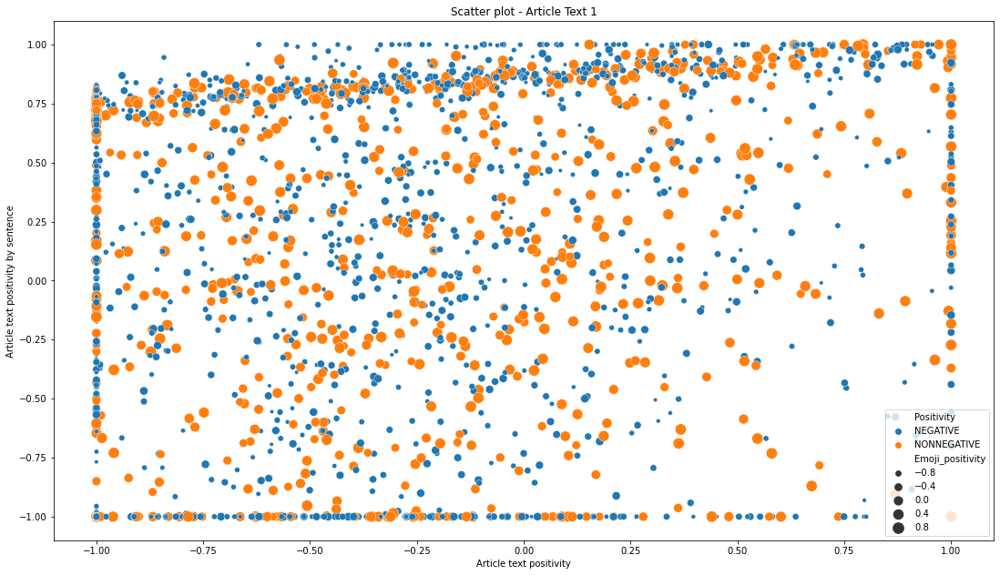

In [97]:
scatter_text_1 = sns.scatterplot(data = df_text, x='Text_positivity', y='Text_positivity_sentence', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Article Text 1')
plt.xlabel('Article text positivity')
plt.ylabel('Article text positivity by sentence')
plt.legend(loc='lower right')


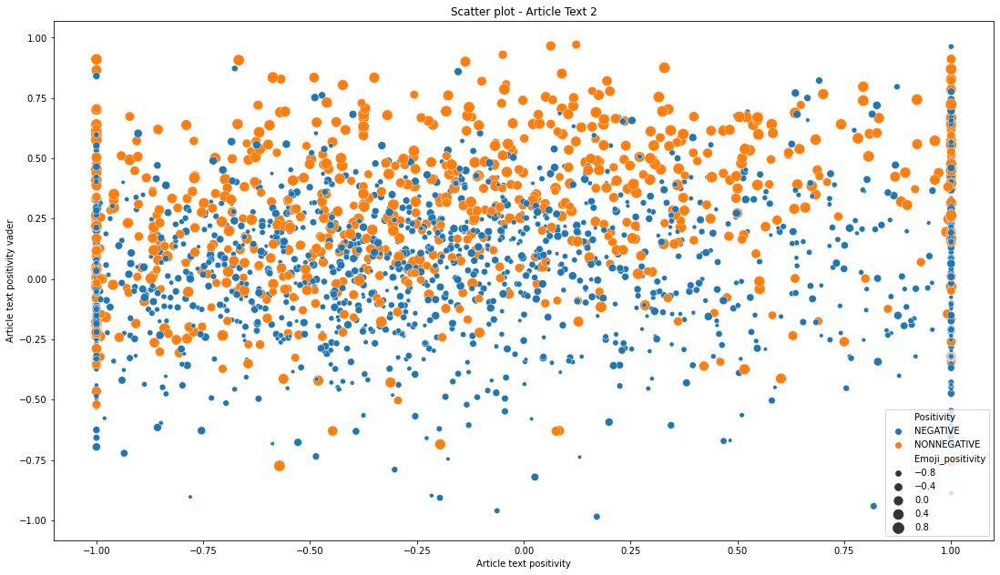

In [98]:
scatter_text_2 = sns.scatterplot(data = df_text, x='Text_positivity', y='Text_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Article Text 2')
plt.xlabel('Article text positivity')
plt.ylabel('Article text positivity vader')
plt.legend(loc='lower right')


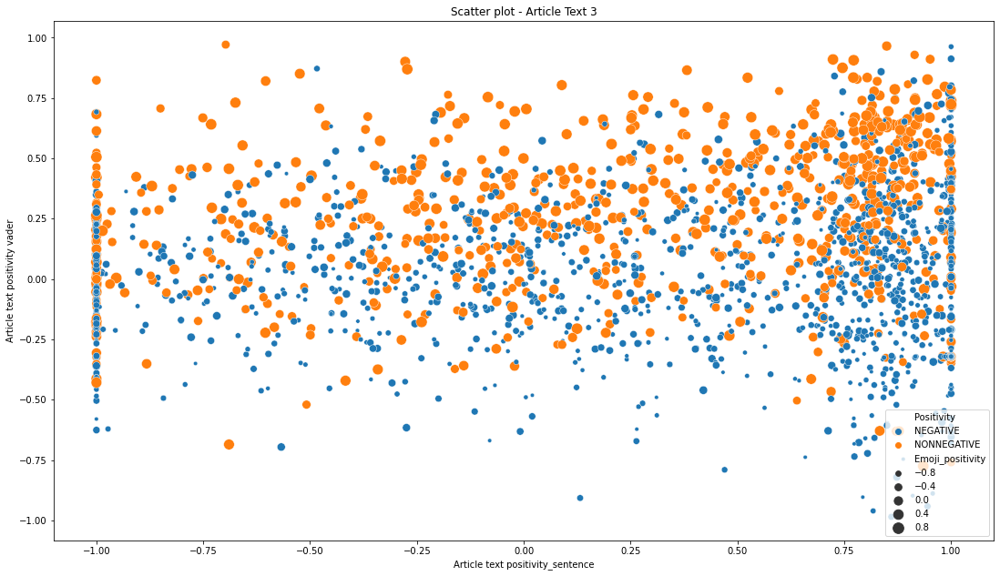

In [99]:
scatter_text_3 = sns.scatterplot(data = df_text, x='Text_positivity_sentence', y='Text_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Article Text 3')
plt.xlabel('Article text positivity_sentence')
plt.ylabel('Article text positivity vader')
plt.legend(loc='lower right')

## Scatter plots - Title

Text(0, 0.5, 'Title positivity by sentence')

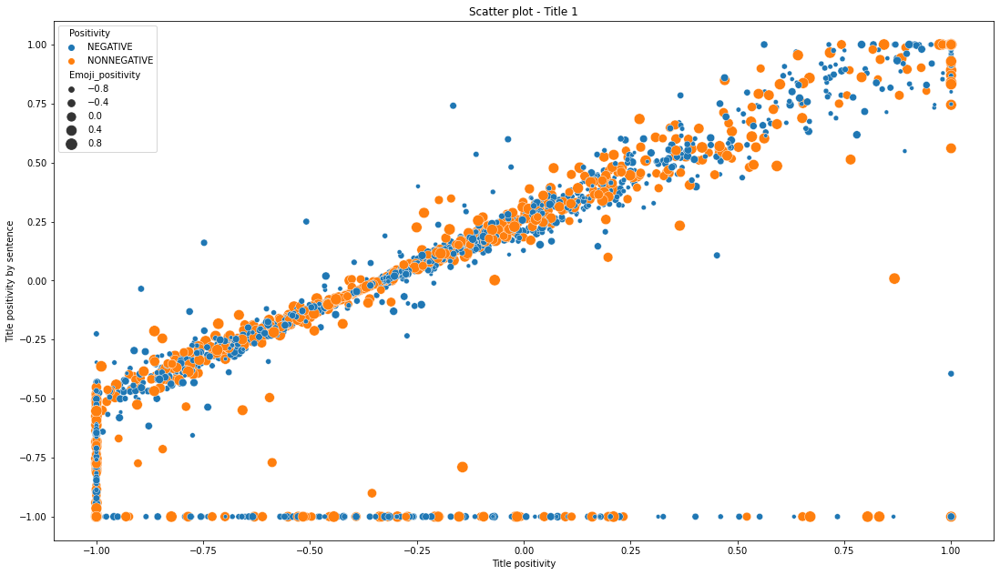

In [100]:
scatter_title_1 = sns.scatterplot(data = df_title, x='Title_positivity', y='Title_positivity_sentence', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Title 1')
plt.xlabel('Title positivity')
plt.ylabel('Title positivity by sentence')


Text(0, 0.5, 'Title positivity vader')

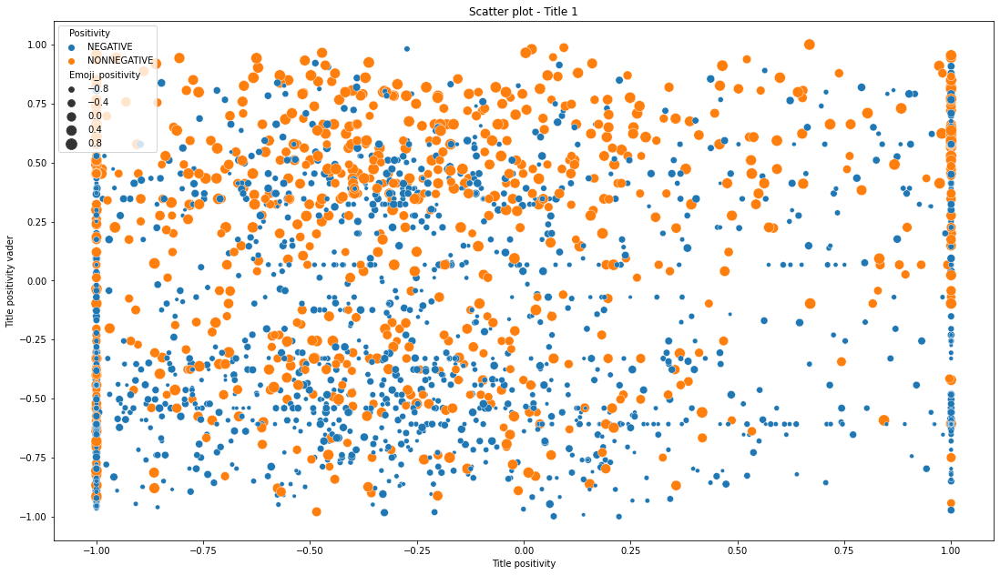

In [101]:
scatter_title_2 = sns.scatterplot(data = df_title, x='Title_positivity', y='Title_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Title 1')
plt.xlabel('Title positivity')
plt.ylabel('Title positivity vader')


Text(0, 0.5, 'Title positivity vader')

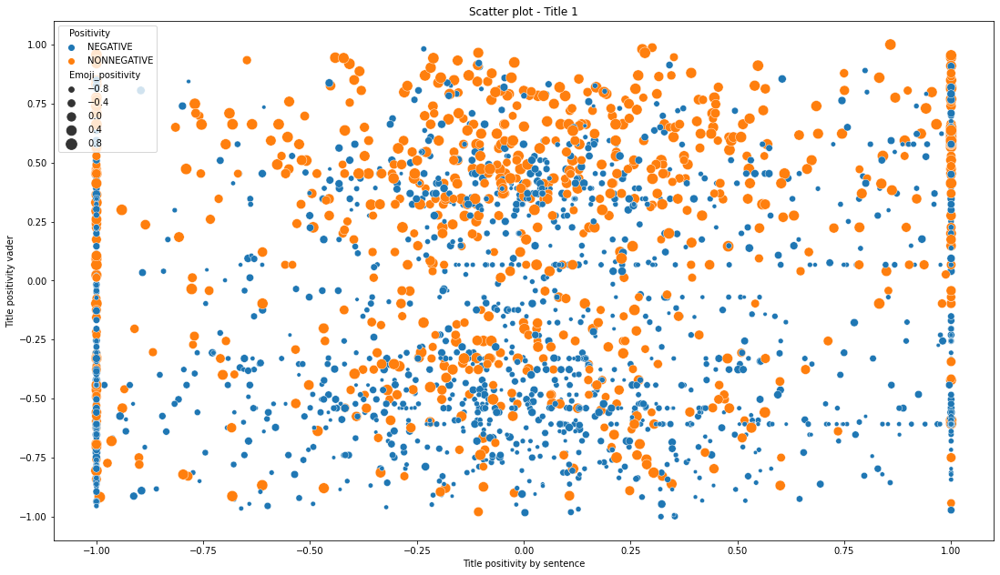

In [102]:
scatter_title_3 = sns.scatterplot(data = df_title, x='Title_positivity_sentence', y='Title_positivity_vader', hue='Positivity',size='Emoji_positivity', sizes=(20,150))

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
plt.xticks(fontsize = 10)
plt.title('Scatter plot - Title 1')
plt.xlabel('Title positivity by sentence')
plt.ylabel('Title positivity vader')